In [1]:
pip install tensorflow==2.11.*

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm 
import random 
import tensorflow 
from keras.layers import Dense, Conv2D, Flatten
from keras.layers import MaxPooling2D, Activation, Dropout
from keras.models import Sequential, load_model
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, array_to_img, load_img
from keras.backend import image_data_format
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.callbacks import TensorBoard
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from glob import glob
import datetime as dt
import numpy as np
import cv2
import os
%matplotlib inline
warnings.filterwarnings('ignore')

In [4]:
input_path = []
label = []

for class_name in os.listdir("animal/animaldisease_dataset/train"):
    for path in os.listdir("animal/animaldisease_dataset/train/"+class_name):
        if class_name == 'Normal Skin':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("animal/animaldisease_dataset/train", class_name, path))
print(input_path[0], label[0])

animal/animaldisease_dataset/train\Lumpy Skin\Lumpy_Skin.png 1


In [5]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,animal/animaldisease_dataset/train\Normal Skin...,0
1,animal/animaldisease_dataset/train\Lumpy Skin\...,1
2,animal/animaldisease_dataset/train\Normal Skin...,0
3,animal/animaldisease_dataset/train\Normal Skin...,0
4,animal/animaldisease_dataset/train\Normal Skin...,0


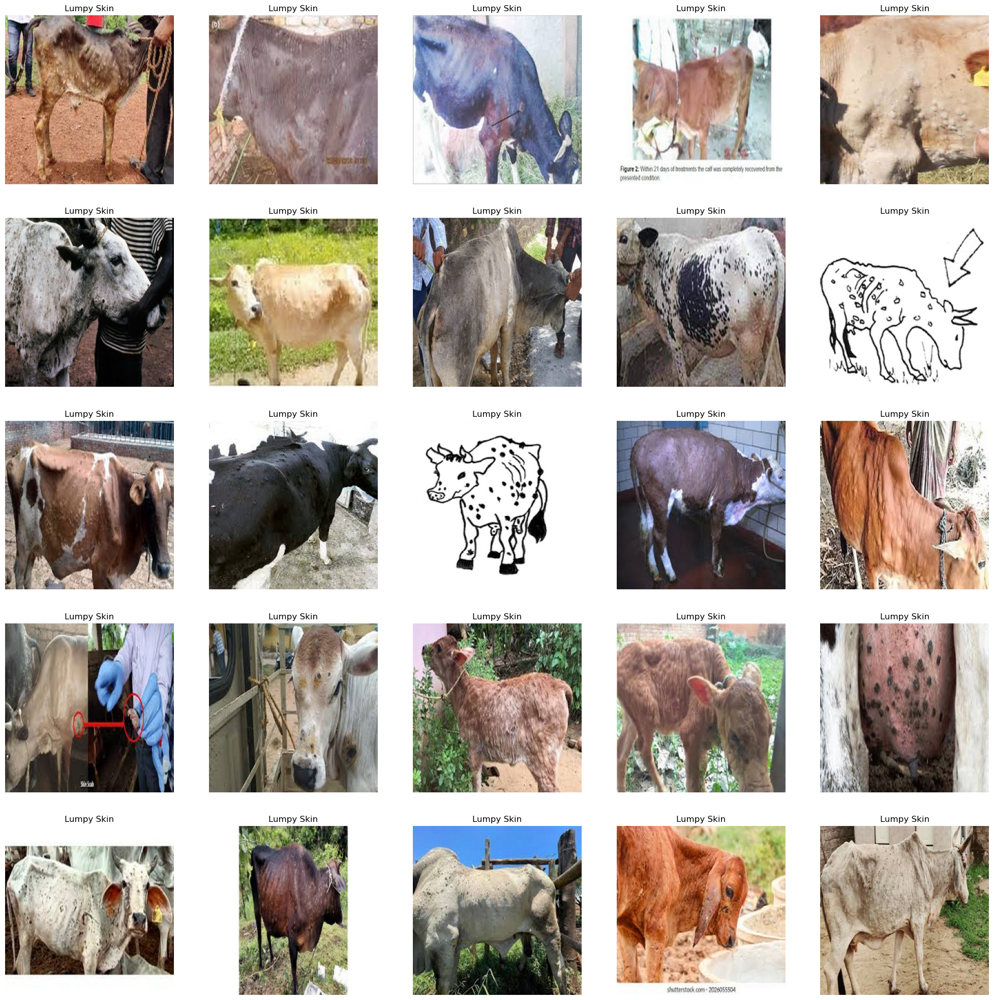

In [6]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Lumpy Skin')
    plt.axis('off')

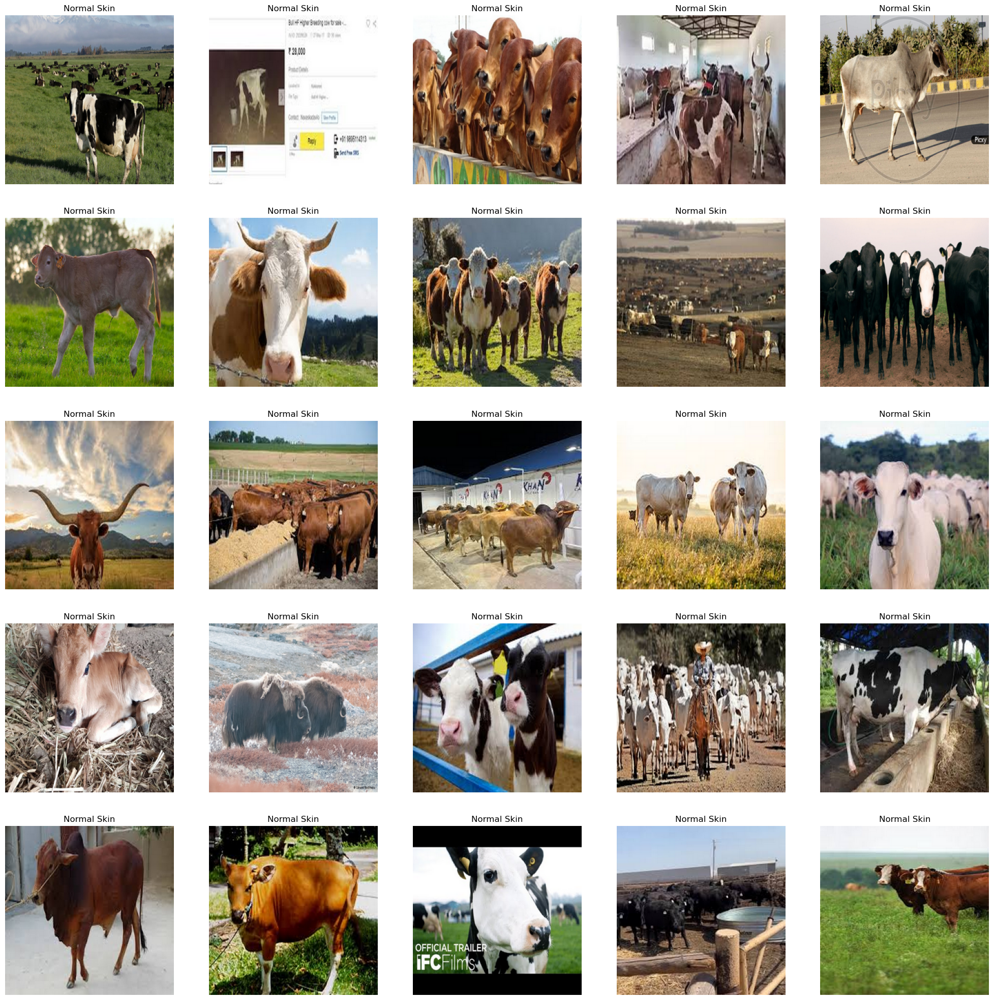

In [7]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Normal Skin')
    plt.axis('off')

In [8]:
train_path = r'animal/animaldisease_dataset/train'
test_path = r'animal/animaldisease_dataset/test'

In [9]:
os.listdir(train_path), os.listdir(test_path)

(['Lumpy Skin', 'Normal Skin'], ['Lumpy Skin', 'Normal Skin'])

In [10]:
# creating Image generator to create more data samples
train_gen = ImageDataGenerator(
            rotation_range=10,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            rescale=1./255,
            horizontal_flip=True,
            vertical_flip=True,
            validation_split=0.25,
            fill_mode='nearest')

test_gen = ImageDataGenerator(rescale=1./255)

def create_sample_dataset(train_path, test_path, train_samples=0, test_samples=0):
    # creating samples for training data
    for fold in os.listdir(train_path):
        for t_img in glob(train_path + '/' + fold + '/*.jpg'):
            img = img_to_array(load_img(t_img))
            img = img.reshape((1,) + img.shape)
            i = 0
            for batch in train_gen.flow(img, 
                                         batch_size=1,
                                         save_to_dir=train_path + '/' + fold,
                                         save_prefix=fold,
                                         save_format='jpg'):
                if i == new_train_samples:
                    break
                i += 1


    # creating samples for testing data
    for fold in os.listdir(test_path):
        for t_img in glob(test_path + '/' + fold + '/*.jpg'):
            img = img_to_array(load_img(t_img))
            img = img.reshape((1, ) + img.shape)
            i = 0
            for batch in test_gen.flow(img, 
                                         batch_size=1,
                                         save_to_dir=test_path + '/' + fold,
                                         save_prefix=fold,
                                         save_format='jpg'):
                if i == new_test_samples:
                    break
                i += 1

In [11]:
#create_sample_dataset(train_path, test_path, train_samples=0, test_samples=0)

In [12]:
batch_size = 32
train_image = train_gen.flow_from_directory(train_path,
                                           target_size=(150, 150),
                                           batch_size=batch_size,
                                           subset='training',
                                           class_mode='binary')

validation_image = train_gen.flow_from_directory(train_path,
                                           target_size=(150, 150),
                                           batch_size=batch_size,
                                           subset='validation',
                                           class_mode='binary')

if image_data_format == 'channels_first':
    input_shape = (3, 150, 150)
else:
    input_shape = (150, 150, 3)

Found 768 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [13]:
def get_model():
    model = Sequential()

    # First Convolutional layer
    model.add(Conv2D(64, (3, 3), input_shape=input_shape, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Second Convolutional layer
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Flattening the input
    model.add(Flatten())

    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))

    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.4))

    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
             optimizer='adam',
            #  optimizer='sgd',
            #  optimizer='rmsprop',
             metrics=['accuracy'])

    print('Model building done')
    return model


def run_model(model, train_samples, test_samples, train_image, test_image, iteration=0, batch_size=8):
    my_callbacks = [
#     EarlyStopping(patience=8),
    ModelCheckpoint(filepath='animal.h5')

    ]
    model.fit_generator(train_image,
                   steps_per_epoch=train_samples//batch_size,
                   epochs=iteration,
                   validation_steps=test_samples//batch_size,
                   callbacks = my_callbacks,
                   validation_data=validation_image
                   )
    # list all data in history
    history = model.history
    # print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()  

In [14]:
train_samples, validation_samples = train_image.samples, validation_image.samples
print('Total train samples: {} and classes {}\nTotal test samples: {} and classes {}'.format(train_samples, np.unique(train_image.classes), validation_samples, np.unique(validation_image.classes)))
my_model = get_model()
my_model.summary()

Total train samples: 768 and classes [0 1]
Total test samples: 256 and classes [0 1]
Model building done
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 41472)             0         
                 

Model building done
Epoch 1/150
24/24 [==============================] - 22s 840ms/step - loss: 0.6252 - accuracy: 0.6589 - val_loss: 0.5654 - val_accuracy: 0.6836
Epoch 2/150
24/24 [==============================] - 20s 823ms/step - loss: 0.5876 - accuracy: 0.6836 - val_loss: 0.5691 - val_accuracy: 0.6836
Epoch 3/150
24/24 [==============================] - 19s 791ms/step - loss: 0.5655 - accuracy: 0.6823 - val_loss: 0.5578 - val_accuracy: 0.6836
Epoch 4/150
24/24 [==============================] - 19s 808ms/step - loss: 0.5603 - accuracy: 0.6836 - val_loss: 0.5407 - val_accuracy: 0.6875
Epoch 5/150
24/24 [==============================] - 17s 701ms/step - loss: 0.5365 - accuracy: 0.6966 - val_loss: 0.5573 - val_accuracy: 0.6914
Epoch 6/150
24/24 [==============================] - 17s 691ms/step - loss: 0.5561 - accuracy: 0.7044 - val_loss: 0.5550 - val_accuracy: 0.7500
Epoch 7/150
24/24 [==============================] - 17s 701ms/step - loss: 0.5332 - accuracy: 0.7214 - val_loss: 0.

24/24 [==============================] - 17s 715ms/step - loss: 0.4472 - accuracy: 0.7995 - val_loss: 0.4559 - val_accuracy: 0.7852
Epoch 58/150
24/24 [==============================] - 17s 725ms/step - loss: 0.4694 - accuracy: 0.7643 - val_loss: 0.4984 - val_accuracy: 0.7695
Epoch 59/150
24/24 [==============================] - 18s 737ms/step - loss: 0.4387 - accuracy: 0.7956 - val_loss: 0.5131 - val_accuracy: 0.7852
Epoch 60/150
24/24 [==============================] - 17s 716ms/step - loss: 0.4433 - accuracy: 0.7943 - val_loss: 0.5037 - val_accuracy: 0.7773
Epoch 61/150
24/24 [==============================] - 17s 704ms/step - loss: 0.4629 - accuracy: 0.7917 - val_loss: 0.4655 - val_accuracy: 0.7891
Epoch 62/150
24/24 [==============================] - 17s 706ms/step - loss: 0.4417 - accuracy: 0.7969 - val_loss: 0.4948 - val_accuracy: 0.7656
Epoch 63/150
24/24 [==============================] - 18s 741ms/step - loss: 0.4722 - accuracy: 0.7878 - val_loss: 0.4592 - val_accuracy: 0.800

24/24 [==============================] - 17s 701ms/step - loss: 0.4234 - accuracy: 0.8177 - val_loss: 0.5077 - val_accuracy: 0.7344
Epoch 114/150
24/24 [==============================] - 17s 695ms/step - loss: 0.4143 - accuracy: 0.8060 - val_loss: 0.4927 - val_accuracy: 0.7812
Epoch 115/150
24/24 [==============================] - 17s 694ms/step - loss: 0.4020 - accuracy: 0.8151 - val_loss: 0.5099 - val_accuracy: 0.7461
Epoch 116/150
24/24 [==============================] - 16s 681ms/step - loss: 0.4168 - accuracy: 0.7917 - val_loss: 0.4110 - val_accuracy: 0.8086
Epoch 117/150
24/24 [==============================] - 16s 686ms/step - loss: 0.3973 - accuracy: 0.8151 - val_loss: 0.4727 - val_accuracy: 0.7695
Epoch 118/150
24/24 [==============================] - 17s 697ms/step - loss: 0.4106 - accuracy: 0.8099 - val_loss: 0.4276 - val_accuracy: 0.7891
Epoch 119/150
24/24 [==============================] - 17s 708ms/step - loss: 0.3969 - accuracy: 0.8099 - val_loss: 0.5365 - val_accuracy:

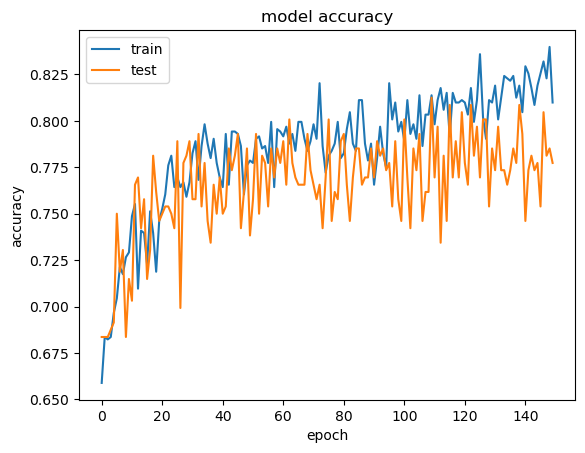

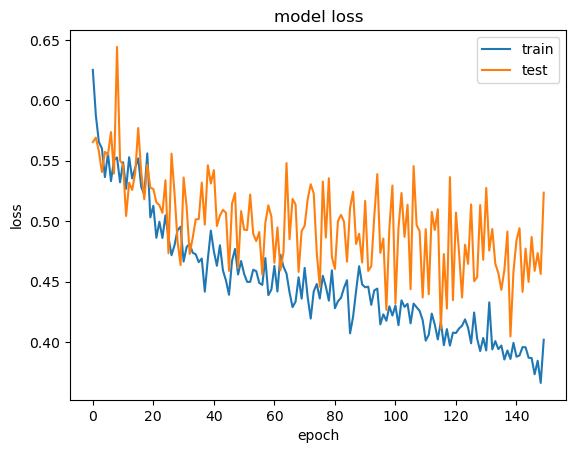

In [15]:
# running model
epochs = 150
my_model = get_model()
run_model(my_model, train_samples, validation_samples, train_image, validation_image, iteration=epochs, batch_size=batch_size)

In [16]:
history = my_model.history
max(history.history['accuracy']), max(history.history['val_accuracy'])

(0.83984375, 0.8125)

In [17]:
min(history.history['loss']), min(history.history['val_loss'])

(0.3660139739513397, 0.40454185009002686)

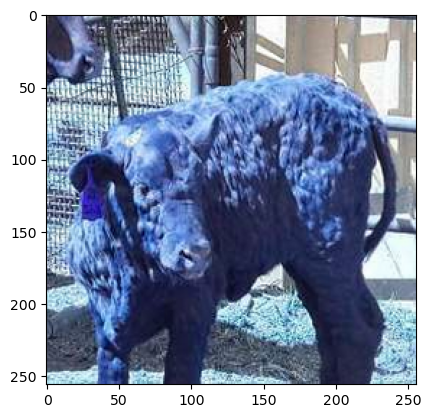

1/1 [==============================] - 0s 212ms/step
Lumpy Skin


In [18]:
#Sample prediction to check the model performance on new image
image = 'animal/animaldisease_dataset/train/Lumpy Skin/Lumpy_Skin_19.png'
img = cv2.imread(image)
plt.imshow(img)
plt.show()
img = cv2.resize(img,(150,150))
img = np.reshape(img, (1, 150, 150, 3))
classes = (my_model.predict(img) > 0.5).astype("int32")
if(classes==1):
    print("Normal skin")
else:
    print("Lumpy Skin")


In [19]:
import pickle

In [20]:
filename = "trained_data.sav"
pickle.dump(my_model, open(filename, 'wb'))

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\flatten
......vars
...layers\max_pooling2d
......vars
...layers\max_pooling2d_1
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json              

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-05-11 12:05:06         3807
metadata.json                                  2023-05-11 12:05:06           64
variables.h5                                   2023-05-11 12:05:06     32160376
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\flatten
......vars
...layers\max_pooling2d
......vars
...layers\max_pooling2d_1
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10


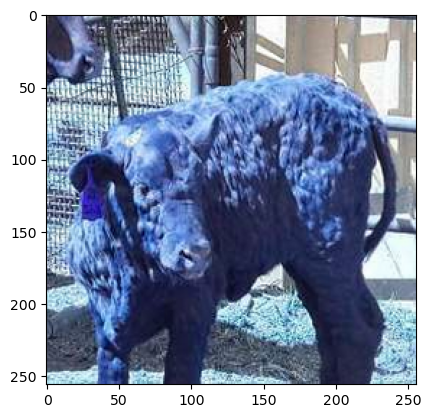

1/1 [==============================] - 0s 81ms/step
Lumpy Skin


In [21]:
# after generating pickle

loaded_model = pickle.load(open('trained_data.sav','rb'))

image = 'animal/animaldisease_dataset/train/Lumpy Skin/Lumpy_Skin_19.png'
img = cv2.imread(image)
plt.imshow(img)
plt.show()
img = cv2.resize(img,(150,150))
img = np.reshape(img, (1, 150, 150, 3))
classes = (loaded_model.predict(img) > 0.5).astype("int32")
if(classes==1):
    print("Normal skin")
else:
    print("Lumpy Skin")
